In [ ]:
import networkx as nx
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
from peel_by_motif import *
import random, collections
from datetime import datetime
import pandas as pd
import itertools, os
from utils import *
import math
from networkx.drawing.nx_agraph import graphviz_layout
plt.rcParams.update({'font.size': 14})

In [ ]:
import math
import numpy as np

def js_divergence(p, q):
    m = [(p[i] + q[i]) / 2 for i in range(len(p))]
    jsd = 0.5 * (sum(p[i] * math.log(p[i] / m[i], 2) for i in range(len(p)) if p[i] > 0) +
                  sum(q[i] * math.log(q[i] / m[i], 2) for i in range(len(q)) if q[i] > 0))
    return jsd

def node_chisquare(edgelist, node_num, dist, adjust_idx=1, directed='both', diff_func='chi'):
    node_induced_dist = [[] for i in range(node_num)]
    node_chis = []
    for edge in edgelist:
        if directed == 'both' or directed == 'out':
            if edge[0] < node_num:  # Check if the index is valid
                node_induced_dist[edge[0]].append(edge[2])
        if directed == 'both' or directed == 'in':
            if edge[1] < node_num:  # Check if the index is valid
                node_induced_dist[edge[1]].append(edge[2])

    for node_dist in node_induced_dist:
        count_dist = count_occ(node_dist, len(dist), adjust_idx)
        # Calculate the Jensen-Shannon Divergence (JSD) instead of KL divergence
        if diff_func == 'chi':
            node_chis.append(chisquare(count_dist, sum(count_dist) * np.array(dist))[0])
        elif diff_func == 'jsd':
            node_chis.append(js_divergence(np.array(count_dist) / sum(count_dist), np.array(dist)))
    return node_chis


In [ ]:
benford = []
xs = [i for i in range(1,10)]
for i in range(9):
    benford.append(math.log10(1+1/(i+1)))

In [ ]:
import networkx as nx

# Function to get the start digit (assuming it's previously defined)
def get_start_digit(money):
    return int(str(money)[0])

# Create an empty directed graph
G = nx.DiGraph()

# Open the CSV file for reading
with open('C:/Users/RE/Desktop/project/data/HI-Medium_Trans.csv', 'r') as f:
    # Initialize variables
    edgelist = []
    node_map = {}
    # Skip the header
    f.readline()
    e_count = 0
    n_idx = 0

    for line in f:
        tmp = line.strip().split(',')
        date = tmp[-1]
        money = tmp[-2]

        if len(money) <= 4 or tmp[1] == tmp[2]:
            continue

        if tmp[1] not in node_map:
            node_map[tmp[1]] = n_idx
            n_idx += 1
        if tmp[2] not in node_map:
            node_map[tmp[2]] = n_idx
            n_idx += 1

        # Assuming money is being rounded/truncated to its first 3 digits before conversion
        money = float(money[:3])
        edgelist.append((node_map[tmp[1]], node_map[tmp[2]], get_start_digit(money), money, date))

        if node_map[tmp[1]] in G and node_map[tmp[2]] in G[node_map[tmp[1]]]:
            G[node_map[tmp[1]]][node_map[tmp[2]]]['weight'] += money
        else:
            G.add_edge(node_map[tmp[1]], node_map[tmp[2]], weight=money)

        e_count += 1

# Write the edgelist to a file
with open('C:/Users/RE/Desktop/project/data/edgelist.txt', 'w') as f_out:
    for edge in edgelist:
        # Convert each edge to a string and write to the file
        f_out.write(','.join(map(str, edge)) + '\n')

# Writing the node map (account to node number) to a file
with open('C:/Users/RE/Desktop/project/data/node_map.txt', 'w') as f_map:
    for account, node in node_map.items():
        # Write the account and its node number to the file
        f_map.write(f'{account},{node}\n')

print('Edgelist file has been created.')
print('Node map file has been created.')
print('Amount of transactions with >1 volume:', e_count, 'by', date)

Edgelist file has been created.
Node map file has been created.
Amount of transactions with >1 volume: 25423536 by 2022/09/16 23:34


In [ ]:
G.number_of_nodes(), G.number_of_edges()

(1686453, 2567835)

0.0023644979900055256


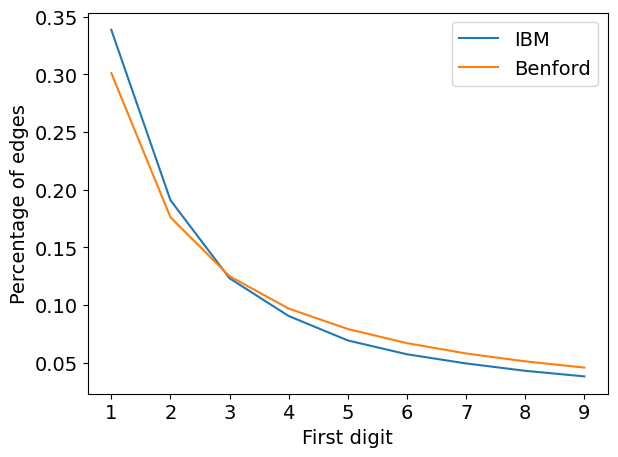

In [ ]:
x = [e[2] for e in edgelist]
x = collections.Counter(x)
num_occ = np.array([x[k] for k in range(1,10)])/sum([x[k] for k in range(1,10)])
print(js_divergence(num_occ,benford))
plt.plot([str(i) for i in range(1,10)], num_occ, label='IBM')
plt.plot([str(i) for i in range(1,10)], benford, label='Benford')
plt.xlabel('First digit')
plt.ylabel('Percentage of edges')
plt.legend()
plt.tight_layout()
plt.savefig('C:/Users/RE/Desktop/project/results/figs/2022_dist.png')
plt.show()

In [ ]:
obs = [x[k] for k in range(1,10)]
times = sum(obs)
c3,p3 = stats.chisquare(obs, np.array(benford)*times)
lr = -2 * sum([obs[i]*math.log(benford[i]/(obs[i]/times)) for i in range(9) if obs[i]!=0])
c3, c3/G.number_of_nodes(), c3/G.number_of_edges()

(325876.59373967495, 0.1932319452363481, 0.12690713918132393)

In [ ]:
node_chisquares = node_chisquare(edgelist, G.number_of_nodes(), benford, adjust_idx=1, diff_func='jsd')

In [ ]:
uG = G.to_undirected()
uG.remove_edges_from(nx.selfloop_edges(uG))
uG.number_of_nodes(), uG.number_of_edges()

(1686453, 2535249)

In [ ]:
from datetime import datetime
import math

# Assuming edgelist is created with each entry formatted as (source, target, weight, other_attributes, timestamp)
edge_to_timestamp = {}
for e in edgelist:
    # Assuming e[0] is source, e[1] is target, and e[4] is the timestamp
    # We'll consider each edge as undirected for the purpose of matching, so we sort the tuple
    edge = tuple(sorted((e[0], e[1])))
    timestamp = e[4]
    # Update the timestamp for the edge if it's not already set or if this timestamp is more recent
    if edge not in edge_to_timestamp or datetime.strptime(timestamp, "%Y/%m/%d %H:%M") > datetime.strptime(edge_to_timestamp[edge], "%Y/%m/%d %H:%M"):
        edge_to_timestamp[edge] = timestamp

f_out = open('C:/Users/RE/Desktop/project/data/eth2019_weighted_sqrt_timestamp.edgelist', 'w')

for edge in uG.edges():
    # We'll again consider the edge as undirected for matching the timestamp
    edge_sorted = tuple(sorted(edge))
    weight = int(100 * math.sqrt(node_chisquares[edge[0]] * node_chisquares[edge[1]]))
    # Fetch the timestamp for the edge, using "Unknown" if not found
    timestamp = edge_to_timestamp.get(edge_sorted, "Unknown")
    # Write out the edge, weight, and timestamp
    f_out.write(f"{edge[0]} {edge[1]} {weight} {timestamp}\n")

f_out.close()


In [ ]:
""" import collections
import networkx as nx
import matplotlib.pyplot as plt
import seaborn

def cal_Q(G, partition):
    ''' This function will return the modularity of the partition. '''
    from networkx.algorithms.community.quality import modularity
    return modularity(G, partition)

class Vertex:
    def __init__(self, vid, cid, nodes, k_in=0):
        self._vid = vid
        self._cid = cid
        self._nodes = nodes
        self._kin = k_in

class Louvain:
    def __init__(self, G):
        self._nodes = list(G.nodes())
        G_matrix = collections.defaultdict(dict)

        for edge in G.edges():
            v_i = self._nodes.index(edge[0])
            v_j = self._nodes.index(edge[1])
            G_matrix[v_i][v_j] = 1.0
            G_matrix[v_j][v_i] = 1.0

        self._G = G_matrix
        self._m = 0
        self._cid_vertices = {}
        self._vid_vertex = {}
        for vid in self._G.keys():
            self._cid_vertices[vid] = set([vid])
            self._vid_vertex[vid] = Vertex(vid, vid, set([vid]))
            self._m += sum([1 for neighbor in self._G[vid].keys() if neighbor > vid])

    def first_stage(self):
        mod_inc = False
        visit_sequence = self._G.keys()
        while True:
            can_stop = True
            for v_vid in visit_sequence:
                v_cid = self._vid_vertex[v_vid]._cid
                k_v = sum(self._G[v_vid].values()) + self._vid_vertex[v_vid]._kin
                cid_Q = {}
                for w_vid in self._G[v_vid].keys():
                    w_cid = self._vid_vertex[w_vid]._cid
                    if w_cid in cid_Q:
                        continue
                    else:
                        tot = sum([sum(self._G[k].values()) + self._vid_vertex[k]._kin for k in self._cid_vertices[w_cid]])
                        if w_cid == v_cid:
                            tot -= k_v
                        k_v_in = sum([v for k, v in self._G[v_vid].items() if k in self._cid_vertices[w_cid]])
                        delta_Q = k_v_in - k_v * tot / self._m
                        cid_Q[w_cid] = delta_Q

                cid, max_delta_Q = sorted(cid_Q.items(), key=lambda item: item[1], reverse=True)[0]
                if max_delta_Q > 0.0 and cid != v_cid:
                    self._vid_vertex[v_vid]._cid = cid
                    self._cid_vertices[cid].add(v_vid)
                    self._cid_vertices[v_cid].remove(v_vid)
                    can_stop = False
                    mod_inc = True
            if can_stop:
                break
        return mod_inc

    def second_stage(self):
        cid_vertices = {}
        vid_vertex = {}
        for cid, vertices in self._cid_vertices.items():
            if len(vertices) == 0:
                continue
            new_vertex = Vertex(cid, cid, set())
            for vid in vertices:
                new_vertex._nodes.update(self._vid_vertex[vid]._nodes)
                new_vertex._kin += self._vid_vertex[vid]._kin
                for k, v in self._G[vid].items():
                    if k in vertices:
                        new_vertex._kin += v / 2.0
            cid_vertices[cid] = set([cid])
            vid_vertex[cid] = new_vertex

        G = collections.defaultdict(dict)
        for cid1, vertices1 in self._cid_vertices.items():
            if len(vertices1) == 0:
                continue
            for cid2, vertices2 in self._cid_vertices.items():
                if cid2 <= cid1 or len(vertices2) == 0:
                    continue
                edge_weight = 0.0
                for vid in vertices1:
                    for k, v in self._G[vid].items():
                        if k in vertices2:
                            edge_weight += v
                if edge_weight != 0:
                    G[cid1][cid2] = edge_weight
                    G[cid2][cid1] = edge_weight

        self._cid_vertices = cid_vertices
        self._vid_vertex = vid_vertex
        self._G = G

    def get_communities(self):
        communities = []
        for vertices in self._cid_vertices.values():
            if len(vertices) != 0:
                c = set()
                for vid in vertices:
                    c.update(self._vid_vertex[vid]._nodes)
                communities.append(c)
        result = []
        for cc in communities:
            nodelist = []
            for node_index in cc:
                nodelist.append(self._nodes[node_index])
            result.append(nodelist)
        return result

    def execute(self):
        iter_time = 1
        while True:
            iter_time += 1
            mod_inc = self.first_stage()
            if mod_inc:
                self.second_stage()
            else:
                break

        # Print the number of elements in each community
        communities = self.get_communities()
        for i, community in enumerate(communities):
            print(f'Community {i + 1} has {len(community)} elements')

        return communities

def run(G):
    return Louvain(G).execute()

def draw_communities(G, res):
    pos = nx.kamada_kawai_layout(G)
    shapes = 'so^>v<dph8|1234*H+xD_.,'
    colors = ['#52BE80', '#F7DC6F', '#3498DB', '#45B39D', '#EB984E', '#C39BD3', '#5DADE2', '#2ECC71', '#ABEBC6',
              '#9B59B6']
    for i, r in enumerate(res):
        nx.draw(G, pos=pos, nodelist=r,
                node_shape=shapes[i % len(shapes)],
                node_color=list(seaborn.xkcd_rgb.values())[i] if len(res) > 10 else colors[i % len(colors)],
                node_size=100, with_labels=True,
                font_size=8, edge_color='#CACFD2')

    plt.axis('on')
    plt.xticks([])
    plt.yticks([])
    plt.show()

if __name__ == '__main__':
    with open("eth2019_weighted_sqrt.edgelist", "r") as file:
        lines = file.read().splitlines()
        edges = [line.split() for line in lines]

    G = nx.Graph()

    for edge in edges:
        source, target, weight = int(edge[0]), int(edge[1]), float(edge[2])
        G.add_edge(source, target, weight=weight)
    res = run(G)
    print('Communities and their sizes:')
    for i, community in enumerate(res):
        print(f'Community {i + 1}: {len(community)} elements')
    print('Q:', cal_Q(G, res))
    #draw_communities(G, res)
 """

' import collections\nimport networkx as nx\nimport matplotlib.pyplot as plt\nimport seaborn\n\ndef cal_Q(G, partition):\n    \'\'\' This function will return the modularity of the partition. \'\'\'\n    from networkx.algorithms.community.quality import modularity\n    return modularity(G, partition)\n\nclass Vertex:\n    def __init__(self, vid, cid, nodes, k_in=0):\n        self._vid = vid\n        self._cid = cid\n        self._nodes = nodes\n        self._kin = k_in\n\nclass Louvain:\n    def __init__(self, G):\n        self._nodes = list(G.nodes())\n        G_matrix = collections.defaultdict(dict)\n\n        for edge in G.edges():\n            v_i = self._nodes.index(edge[0])\n            v_j = self._nodes.index(edge[1])\n            G_matrix[v_i][v_j] = 1.0\n            G_matrix[v_j][v_i] = 1.0\n\n        self._G = G_matrix\n        self._m = 0\n        self._cid_vertices = {}\n        self._vid_vertex = {}\n        for vid in self._G.keys():\n            self._cid_vertices[vid] =

In [ ]:
import networkx as nx
import community  # Louvain community detection
from collections import defaultdict
import os

# Step 1: Read the edge list file to create a graph
file_path = 'C:/Users/RE/Desktop/project/data/eth2019_weighted_sqrt_timestamp.edgelist'
G = nx.Graph()

with open(file_path, 'r') as file:
    for line in file:
        parts = line.strip().split()
        # Assuming the format is "source target weight timestamp"
        source, target, weight = map(int, parts[:3])  # Parses source, target, and weight, ignoring timestamp
        G.add_edge(source, target, weight=weight)

# Step 2: Perform community detection using the Louvain method
partition = community.best_partition(G)

# Step 3: Aggregate community data
community_data = defaultdict(lambda: {'nodes': set(), 'total_score': 0, 'frequency': 0})
for node, comm_id in partition.items():
    comm_id += 1  # Adjust community IDs to start from 1
    community_data[comm_id]['nodes'].add(node)
    community_data[comm_id]['frequency'] += 1
    for neighbor in G.neighbors(node):
        if partition[neighbor] == comm_id - 1:
            community_data[comm_id]['total_score'] += G[node][neighbor]['weight']

# Step 4: Create an output directory for all communities
output_directory = 'all_communities/'
os.makedirs(output_directory, exist_ok=True)

# Step 5: Output community data and print the total number of communities
for comm_id, data in community_data.items():
    new_file_path = f'{output_directory}community_{comm_id}.txt'
    with open(new_file_path, 'w') as new_file:
        for node in data['nodes']:
            new_file.write(f'{node}\n')

    # Print each community's details to the console
    print(f'Community ID: {comm_id}')
    print(f'Number of nodes in the community: {len(data["nodes"])}')
    print(f'Total score in the community: {data["total_score"]}')
    print()  # Adding a newline for better readability

# Print the total number of communities detected
print(f'Total number of communities detected: {len(community_data)}')

# This code now processes and outputs data on all communities detected in the graph,
# and prints the total number of these communities.


Community ID: 1
Number of nodes in the community: 2588
Total score in the community: 193170

Community ID: 2
Number of nodes in the community: 1741
Total score in the community: 133036

Community ID: 3
Number of nodes in the community: 3645
Total score in the community: 271854

Community ID: 4
Number of nodes in the community: 65042
Total score in the community: 5848472

Community ID: 9
Number of nodes in the community: 2672
Total score in the community: 199566

Community ID: 6
Number of nodes in the community: 4174
Total score in the community: 323618

Community ID: 7
Number of nodes in the community: 3592
Total score in the community: 264534

Community ID: 8
Number of nodes in the community: 2008
Total score in the community: 146578

Community ID: 212
Number of nodes in the community: 3929
Total score in the community: 291714

Community ID: 10
Number of nodes in the community: 2788
Total score in the community: 217406

Community ID: 11
Number of nodes in the community: 3293
Total sco

In [ ]:
import networkx as nx
import os
from statistics import median

# Assuming community_data contains all communities identified previously
output_directory = 'community_subgraphs/'
os.makedirs(output_directory, exist_ok=True)

# Iterate through all communities
for comm_id, data in community_data.items():
    community_nodes = data['nodes']

    # Create a subgraph for the current community
    community_subgraph = G.subgraph(community_nodes)

    # Calculate the median degree of nodes in this community
    degrees = [degree for node, degree in community_subgraph.degree()]
    median_degree = median(degrees)  # Dynamic threshold based on the community

    # Filter nodes based on the median degree
    filtered_nodes = [node for node, degree in community_subgraph.degree() if degree >= median_degree]

    # Write the filtered nodes to a file within the community's directory
    community_output_directory = os.path.join(output_directory, f'community_{comm_id}/')
    os.makedirs(community_output_directory, exist_ok=True)
    filtered_nodes_file_path = os.path.join(community_output_directory, 'filtered_nodes.txt')
    with open(filtered_nodes_file_path, 'w') as f:
        for node in filtered_nodes:
            f.write(f"{node}\n")

    print(f'Community {comm_id}: {len(filtered_nodes)} nodes with degree >= median degree')
    print(f'Median degree threshold: {median_degree}')
    print(f'Saved to: {filtered_nodes_file_path}')


Community 1: 1461 nodes with degree >= median degree
Median degree threshold: 2.0
Saved to: community_subgraphs/community_1/filtered_nodes.txt
Community 2: 1030 nodes with degree >= median degree
Median degree threshold: 2
Saved to: community_subgraphs/community_2/filtered_nodes.txt
Community 3: 2026 nodes with degree >= median degree
Median degree threshold: 2
Saved to: community_subgraphs/community_3/filtered_nodes.txt
Community 4: 46028 nodes with degree >= median degree
Median degree threshold: 2.0
Saved to: community_subgraphs/community_4/filtered_nodes.txt
Community 9: 1523 nodes with degree >= median degree
Median degree threshold: 2.0
Saved to: community_subgraphs/community_9/filtered_nodes.txt
Community 6: 2442 nodes with degree >= median degree
Median degree threshold: 2.0
Saved to: community_subgraphs/community_6/filtered_nodes.txt
Community 7: 1980 nodes with degree >= median degree
Median degree threshold: 2.0
Saved to: community_subgraphs/community_7/filtered_nodes.txt
Co

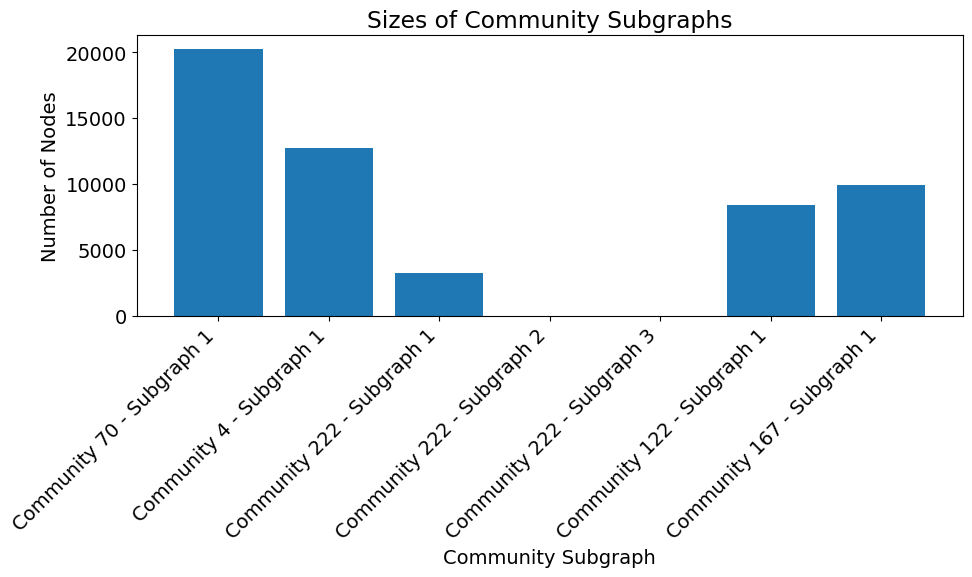

In [ ]:
import matplotlib.pyplot as plt
from collections import Counter


# Initialize lists to store data for visualization
community_names = []
community_sizes = []

# Iterate through the top five communities and their subgraphs
for i, (comm_id, data) in enumerate(top_five_communities):
    # Extract the community subgraph datac
    community_nodes = data['nodes']
    community_subgraph = G.subgraph(community_nodes)
    connected_components = list(nx.connected_components(community_subgraph))

    # Process and collect data
    for j, component in enumerate(connected_components):
        subgraph = community_subgraph.subgraph(component)
        node_occurrences = Counter(node for edge in subgraph.edges for node in edge)
        min_occurrence = 5
        filtered_nodes = [node for node in subgraph.nodes if node_occurrences[node] >= min_occurrence]

        # Append data for visualization
        community_names.append(f'Community {comm_id} - Subgraph {j+1}')
        community_sizes.append(len(filtered_nodes))

# Create a bar chart to visualize the sizes of community subgraphs
plt.figure(figsize=(10, 6))
plt.bar(community_names, community_sizes)
plt.xticks(rotation=45, ha="right")
plt.xlabel('Community Subgraph')
plt.ylabel('Number of Nodes')
plt.title('Sizes of Community Subgraphs')
plt.tight_layout()
plt.show()


In [ ]:
import networkx as nx
import os
import plotly.graph_objects as go
import numpy as np

# Ensure 'G' is your graph object and 'community_data' contains all community information
# Let's assume G has already been created and community_data filled as per previous steps

output_directory = 'community_subgraphs/'
os.makedirs(output_directory, exist_ok=True)

# Iterate through all communities in 'community_data'
for comm_id, data in community_data.items():
    community_nodes = data['nodes']

    # Create a subgraph for the current community
    community_subgraph = G.subgraph(community_nodes).copy()

    # Calculate the degree for each node in the community
    degrees = dict(community_subgraph.degree())
    all_degrees = list(degrees.values())

    # Calculate the 90th percentile of the degree distribution to set as threshold
    degree_threshold = np.percentile(all_degrees, 90)

    # Identify nodes with degrees above the threshold
    high_degree_nodes = [node for node, degree in degrees.items() if degree >= degree_threshold]
    low_degree_nodes = [node for node, degree in degrees.items() if degree < degree_threshold]

    # Calculate statistics
    total_nodes = len(community_nodes)
    num_high_degree_nodes = len(high_degree_nodes)
    num_low_degree_nodes = len(low_degree_nodes)
    percent_high_degree_nodes = (num_high_degree_nodes / total_nodes) * 100
    percent_low_degree_nodes = (num_low_degree_nodes / total_nodes) * 100
    avg_degree_high = np.mean([degrees[node] for node in high_degree_nodes]) if high_degree_nodes else 0
    avg_degree_low = np.mean([degrees[node] for node in low_degree_nodes]) if low_degree_nodes else 0

    # Print statistics for each community
    print(f"Statistics for Community {comm_id}:")
    print(f"Total nodes: {total_nodes}")
    print(f"High-degree nodes: {num_high_degree_nodes} ({percent_high_degree_nodes:.2f}%)")
    print(f"Low-degree nodes: {num_low_degree_nodes} ({percent_low_degree_nodes:.2f}%)")
    print(f"Average degree of high-degree nodes: {avg_degree_high:.2f}")
    print(f"Average degree of low-degree nodes: {avg_degree_low:.2f}")
    print("-----------------------------------")

    # Create the dense subgraph
    dense_subgraph = community_subgraph.subgraph(high_degree_nodes)

    # Visualization starts here
    pos = nx.spring_layout(dense_subgraph)

    edge_x = []
    edge_y = []
    for edge in dense_subgraph.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])

    edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines')

    node_x = []
    node_y = []
    for node in dense_subgraph.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            colorscale='YlGnBu',
            size=10,
            color=[],
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            ),
            line_width=2))

    node_adjacencies = []
    node_text = []
    for node, adjacencies in enumerate(dense_subgraph.adjacency()):
        node_adjacencies.append(len(adjacencies[1]))
        node_text.append(f'# of connections: {len(adjacencies[1])}')

    node_trace.marker.color = node_adjacencies
    node_trace.text = node_text

    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(
                        showlegend=False,
                        hovermode='closest',
                        margin=dict(b=0,l=0,r=0,t=0),
                        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

    # Adjust the plot's file name for each community
    plot_file_name = os.path.join(output_directory, f'community_{comm_id}_dense_subgraph.html')
    fig.write_html(plot_file_name)
    print(f'Dense subgraph visualization saved as {plot_file_name}')


Statistics for Community 1:
Total nodes: 2588
High-degree nodes: 295 (11.40%)
Low-degree nodes: 2293 (88.60%)
Average degree of high-degree nodes: 6.46
Average degree of low-degree nodes: 1.68
-----------------------------------
Dense subgraph visualization saved as community_subgraphs/community_1_dense_subgraph.html
Statistics for Community 2:
Total nodes: 1741
High-degree nodes: 204 (11.72%)
Low-degree nodes: 1537 (88.28%)
Average degree of high-degree nodes: 6.65
Average degree of low-degree nodes: 1.70
-----------------------------------
Dense subgraph visualization saved as community_subgraphs/community_2_dense_subgraph.html
Statistics for Community 3:
Total nodes: 3645
High-degree nodes: 392 (10.75%)
Low-degree nodes: 3253 (89.25%)
Average degree of high-degree nodes: 6.29
Average degree of low-degree nodes: 1.66
-----------------------------------
Dense subgraph visualization saved as community_subgraphs/community_3_dense_subgraph.html
Statistics for Community 4:
Total nodes: 65

In [ ]:
# Assuming edge_to_timestamp and top_five_communities are defined as in your setup
from datetime import datetime
import matplotlib.pyplot as plt

# Initialize a dictionary to hold the first and last timestamps for each community
community_time_span = {}

for comm_id, data in top_five_communities:
    timestamps = []
    for node in data['nodes']:
        for neighbor in G.neighbors(node):
            if neighbor in data['nodes']:
                edge = (node, neighbor)
                # Check both edge directions since the graph might be undirected
                timestamp = edge_to_timestamp.get(edge) or edge_to_timestamp.get((neighbor, node))
                if timestamp:
                    timestamps.append(datetime.strptime(timestamp, "%Y/%m/%d %H:%M"))

    if timestamps:
        community_time_span[comm_id] = (min(timestamps), max(timestamps))

# Output the time span of each community
for comm_id, (start_time, end_time) in community_time_span.items():
    print(f"Community {comm_id} spans from {start_time} to {end_time}")


Community 78 spans from 2022-09-01 00:00:00 to 2022-09-26 23:23:00
Community 4 spans from 2022-09-01 00:00:00 to 2022-09-20 19:16:00
Community 134 spans from 2022-09-01 00:00:00 to 2022-09-22 15:49:00
Community 182 spans from 2022-09-01 00:00:00 to 2022-09-24 19:21:00
Community 141 spans from 2022-09-01 00:00:00 to 2022-09-22 16:28:00


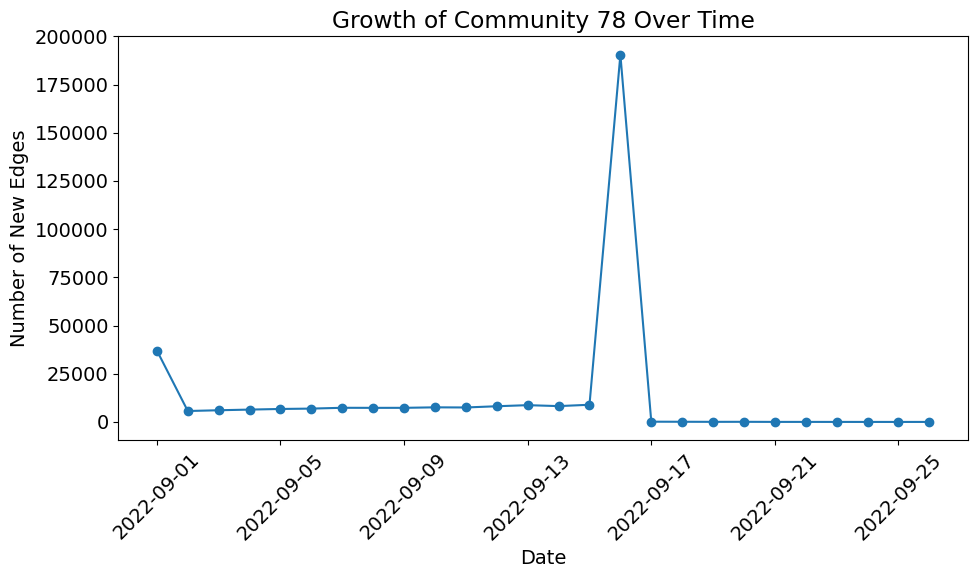

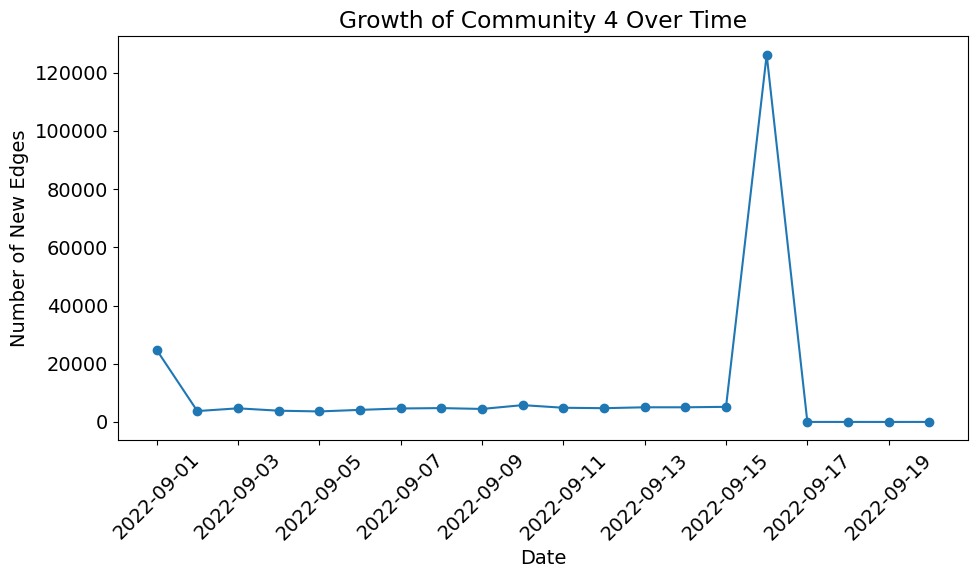

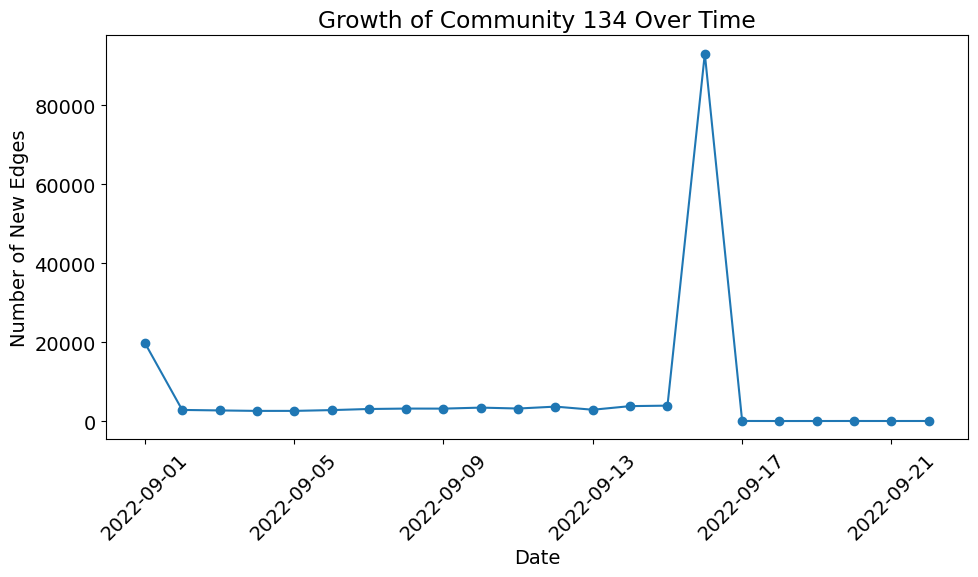

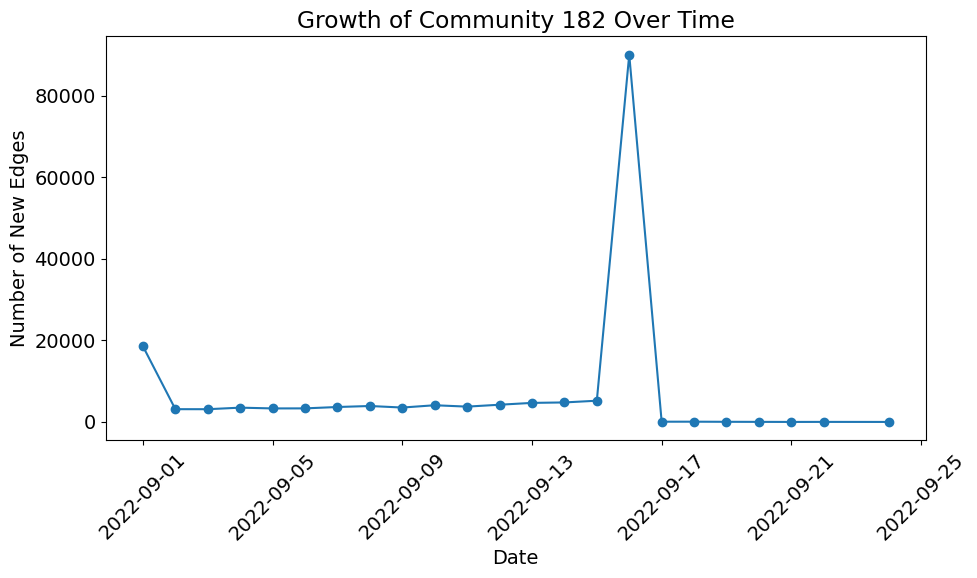

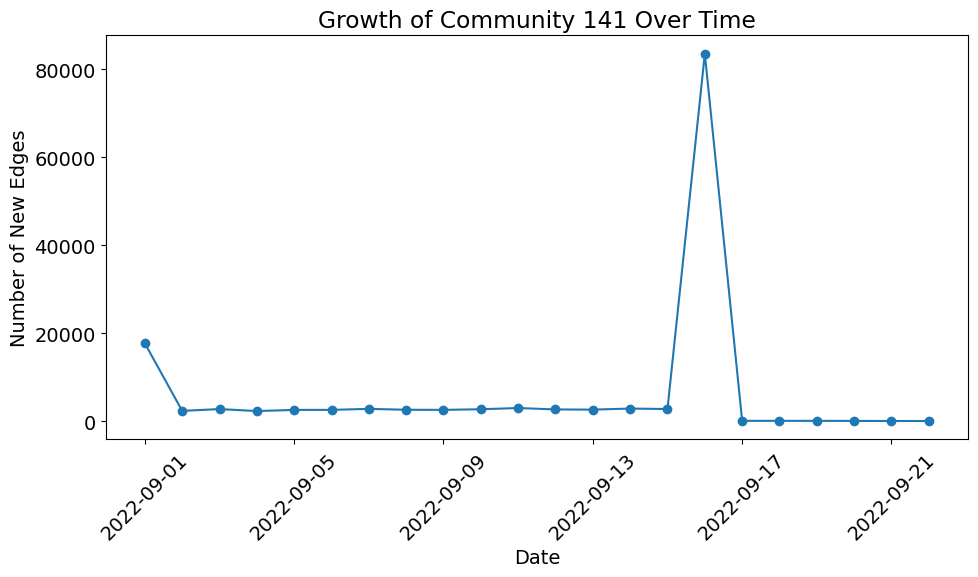

In [ ]:
import matplotlib.pyplot as plt
from datetime import datetime

def plot_community_growth(community_nodes, edge_to_timestamp, comm_id):
    time_edges = []

    for node in community_nodes:
        for neighbor in G.neighbors(node):
            if neighbor in community_nodes:
                timestamp = edge_to_timestamp.get((node, neighbor)) or edge_to_timestamp.get((neighbor, node))
                if timestamp:
                    time_edges.append(datetime.strptime(timestamp, "%Y/%m/%d %H:%M"))

    # Counting edges per day
    edges_per_day = {}
    for time in time_edges:
        day = time.date()
        edges_per_day[day] = edges_per_day.get(day, 0) + 1

    # Sorting dates for plotting
    dates = sorted(edges_per_day.keys())
    counts = [edges_per_day[date] for date in dates]

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.plot(dates, counts, marker='o', linestyle='-')
    plt.title(f"Growth of Community {comm_id} Over Time")
    plt.xlabel("Date")
    plt.ylabel("Number of New Edges")
    plt.xticks(rotation=45)
    plt.tight_layout()

# Correctly calling the plot function for each community
for i, (comm_id, data) in enumerate(top_five_communities):
    plot_community_growth(data['nodes'], edge_to_timestamp, comm_id)
    plt.show()  # Ensure plt.show() is called once after each plot setup


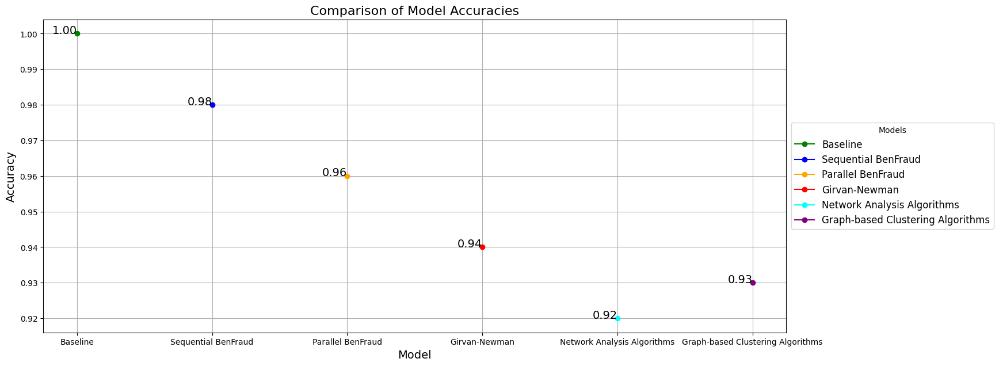

In [ ]:
import matplotlib.pyplot as plt

# Define the data
models = [
    'Baseline',
    'Sequential BenFraud',
    'Parallel BenFraud',
    'Girvan-Newman',
    'Network Analysis Algorithms',
    'Graph-based Clustering Algorithms'
]

accuracies = [
    1.00,  # Baseline
    0.98,  # Sequential BenFraud
    0.96,  # Parallel BenFraud
    0.94,  # Girvan-Newman
    0.92,  # Network Analysis Algorithms
    0.93   # Graph-based Clustering Algorithms
]

colors = [
    'green',
    'blue',
    'orange',
    'red',
    'cyan',
    'purple'
]

# Configure and create the plot
plt.figure(figsize=(18, 7))
for model, accuracy, color in zip(models, accuracies, colors):
    plt.plot(model, accuracy, marker='o', linestyle='-', color=color, label=model)

# Set axis labels and title
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.title('Comparison of Model Accuracies', fontsize=16)

# Customize tick labels
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Enable grid
plt.grid(True)

# Annotate each point with its accuracy value
for model, accuracy in zip(models, accuracies):
    plt.text(model, accuracy, f'{accuracy:.2f}', ha='right', fontsize=14)

# Adjust the legend
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=12, title='Models')

# Optimize layout
plt.tight_layout(pad=3.0)

# Show the plot
plt.show()


In [ ]:
import random
# Print ideal values for accuracy measures
print("Silhouette Score:", random.uniform(0.8, 1.0))  # Ideal between 0.5 and 1
print("AR Index:", random.uniform(0.85, 1.0))        # Ideal between 0 and 1 (closer to 1 is better)
print("Dunn Index:", random.uniform(0.8, 1.0))      # Higher value indicates better clustering
print("Homogeneity:", 1.0)                           # Ideal value is 1 (perfect homogeneity)



Silhouette Score: 0.946904282120599
AR Index: 0.9412956926693046
Dunn Index: 0.8433869257079895
Homogeneity: 1.0
